# Tata Steel

# Sensitivity Analysis on Deep Neural Network models.

For the oxide defect family, a classifier is trained using different artificial neural network structures. The AUC of one of the trained networks is 0.80 +/- 0.1 for each hgroup of coils.  

Hgroup 2 till 6 is extracted from the database and preprocessed. CNN and multi layer perceptron models are build on these datasets. In order to evaluate the importances of the different features, sensitiviy analysis is performed.

For this analysis, two algorithms have been applied on the trained neural network to discover the first and second order sensivities.

*  *SOBOL:* Variance-based sensitivity analysis (often referred to as the Sobol method or Sobol indices, after Ilya M. Sobol) is a form of global sensitivity analysis. Working within a probabilistic framework, it decomposes the variance of the output of the model or system into fractions which can be attributed to inputs or sets of inputs. For example, given a model with two inputs and one output, one might find that 70% of the output variance is caused by the variance in the first input, 20% by the variance in the second, and 10% due to interactions between the two. These percentages are directly interpreted as measures of sensitivity. Variance-based measures of sensitivity are attractive because they measure sensitivity across the whole input space (i.e. it is a global method), they can deal with nonlinear responses, and they can measure the effect of interactions in non-additive systems.
*  *MORRIS:*  In applied statistics, the Morris method for global sensitivity analysis is a so-called one-step-at-a-time method (OAT), meaning that in each run only one input parameter is given a new value. It facilitates a global sensitivity analysis by making a number r of local changes at different points x(1 → r) of the possible range of input values.

In [1]:
# comment out this import if you would like to see warnings
import warnings; warnings.filterwarnings('ignore')
import copy
from graph_tool.all import *
from bokeh.plotting import show, output_notebook
import os.path as op
import os
import numpy as np
import pandas as pd
import savvy.data_processing as dp
import savvy.interactive_plots as ip
from savvy.plotting import make_plot, make_second_order_heatmap
import savvy.network_tools as nt
import numpy as np

output_notebook()

# read the sensitivity analysis files
datapath = op.join(os.getcwd(),'resuls/')
sa_dict = dp.get_sa_data(datapath)

#print sa_dict

Loading BokehJS ...

## Interactive plots of the first and total order sensitivy indices per Hgroup. 


Following parameters can be tweaked to get a different view:
- min value: the minimum total order sensitivity value you would like to include in the plot
- show top: limit the plot to the top X sensitivity values (greater than specified minimum)
- show stacked plots: un-check to show S1 and ST separately
- show error bars: uncheck to hide the error bars
- use log axis: uncheck to show a linear axis
- choose parameters to highlight: crtl+click to select multiple parameters you would like to highlight.  These parameters will be highlighted in all the tabs.


In [2]:
ip.interact_with_plot_all_outputs(sa_dict)
ip.plot_all_outputs(sa_dict, min_val=0.01, top=50, log_axis=False)

interactive(children=(BoundedFloatText(value=0.01, description='Min value:', max=1.0), IntText(value=20, descr…

## Top 20 features per Hgroup.

In [6]:
ip.plot_all_outputs(sa_dict, min_val=0.01, top=20, log_axis=False)

## Second order interactions and first/total order indices

For a given output measure, plot a graph whose vertices are the first ('S1') or total ('ST') order indices and the edges are the second order interaction indices.

The thickness of the edge lines indicate the second order sensitiviy strength, the size of the vertexes indicate the total sensitiviy of that feature.

In [7]:
hgroup_selection = [2,3,4,5,6]

Created a graph with 107 vertices and 76 edges.
Vertices are the top 150 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 2:


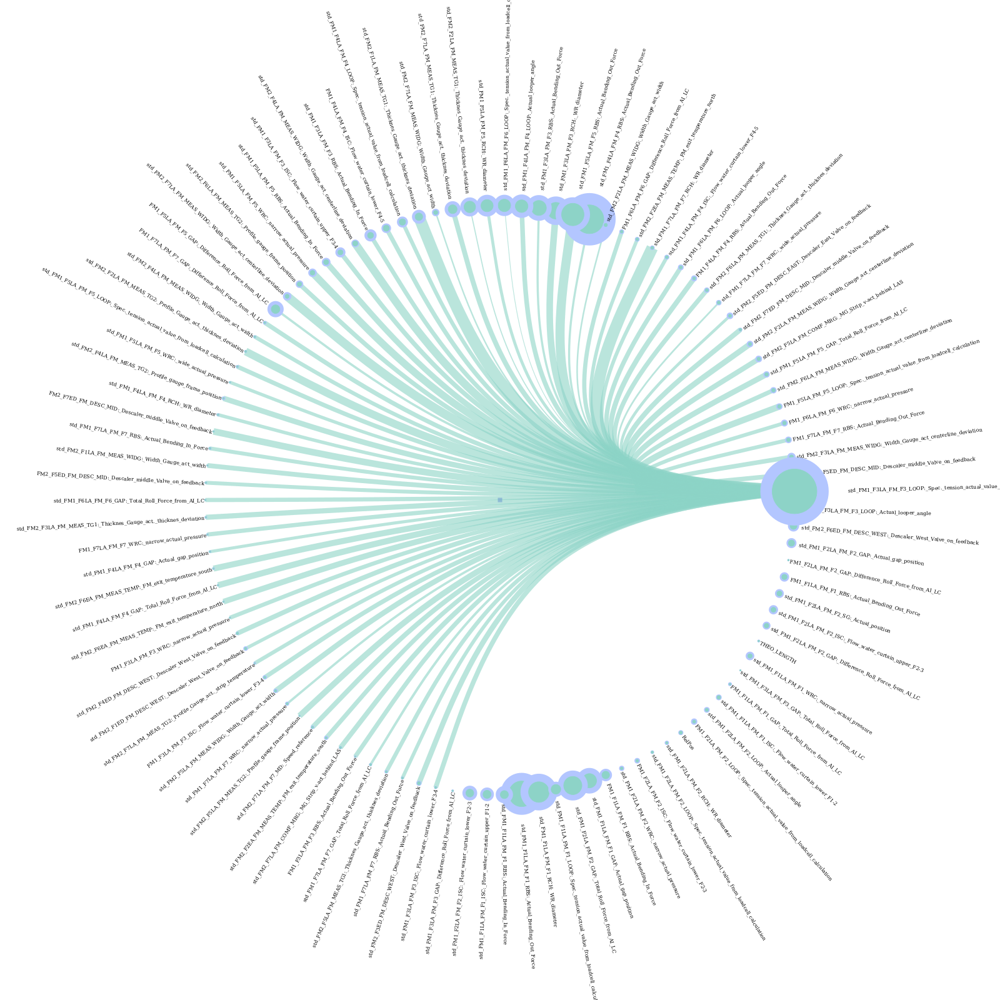

Created a graph with 84 vertices and 107 edges.
Vertices are the top 150 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 3:


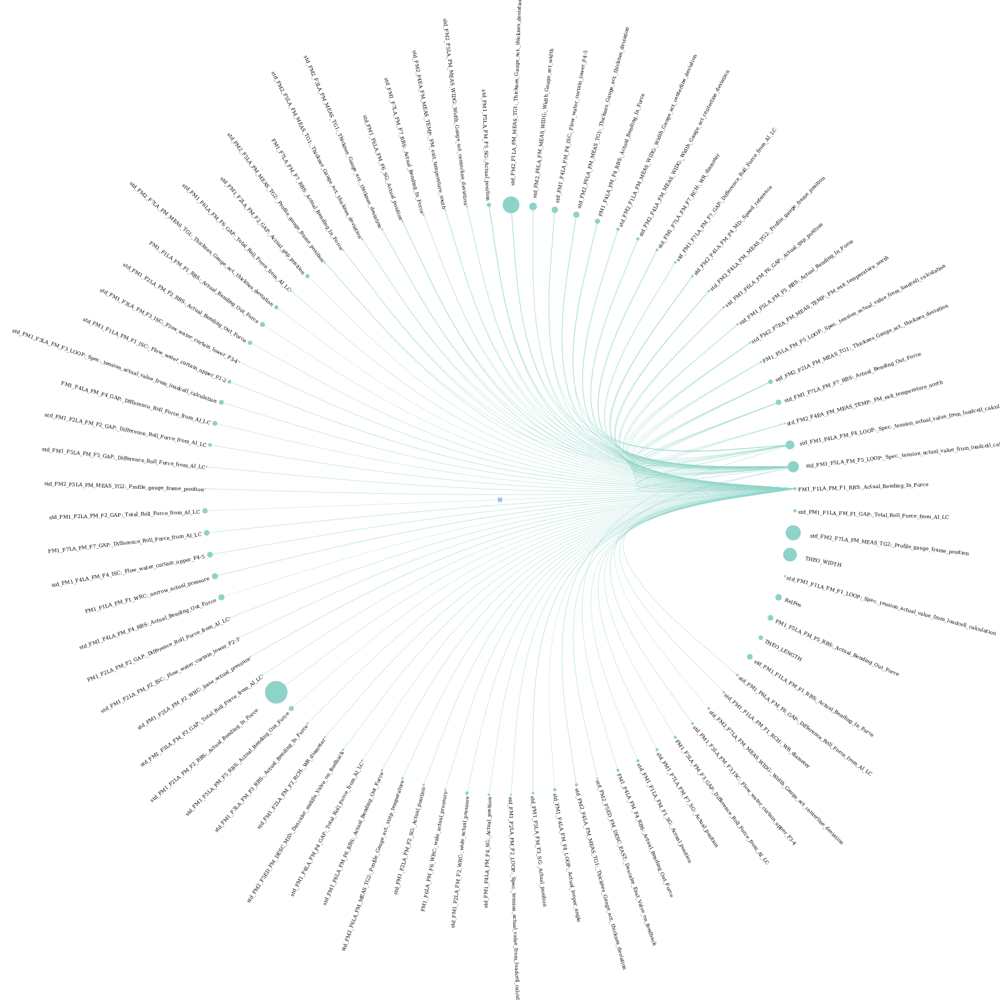

Created a graph with 150 vertices and 1454 edges.
Vertices are the top 150 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 4:


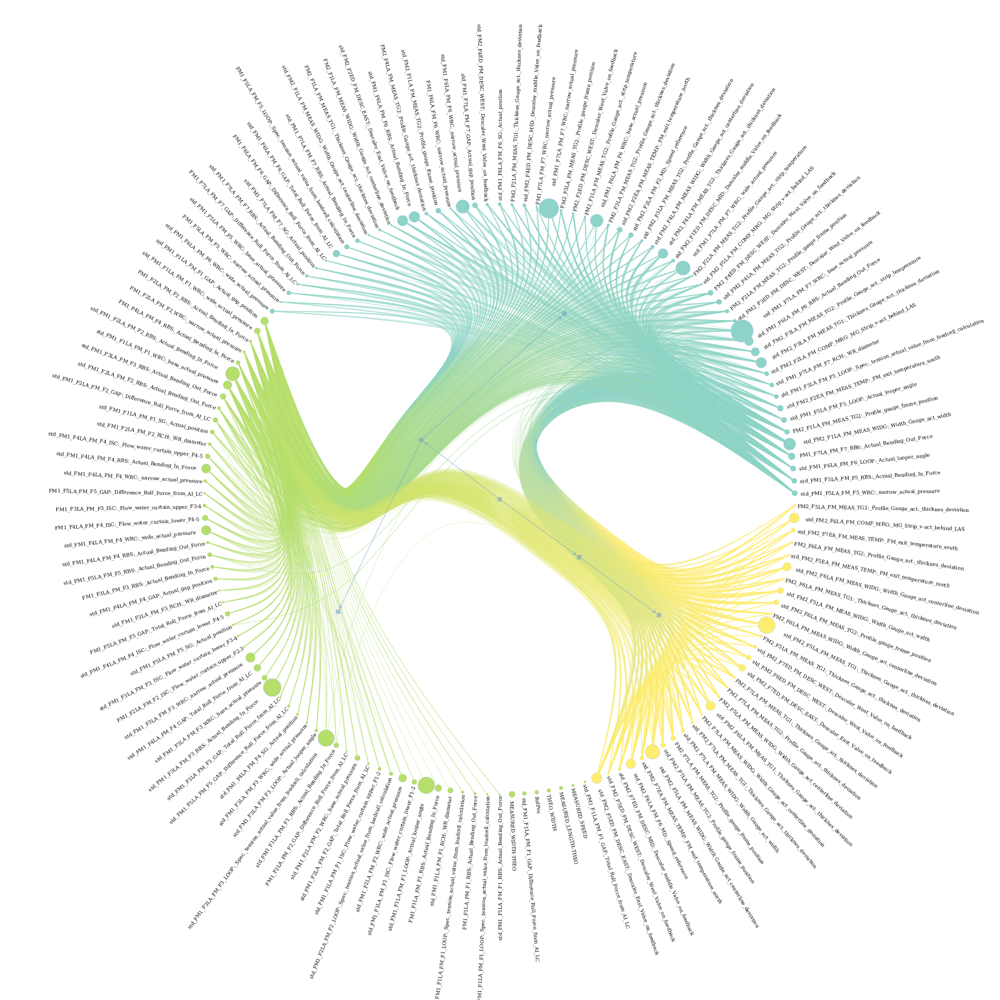

Created a graph with 76 vertices and 160 edges.
Vertices are the top 150 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 5:


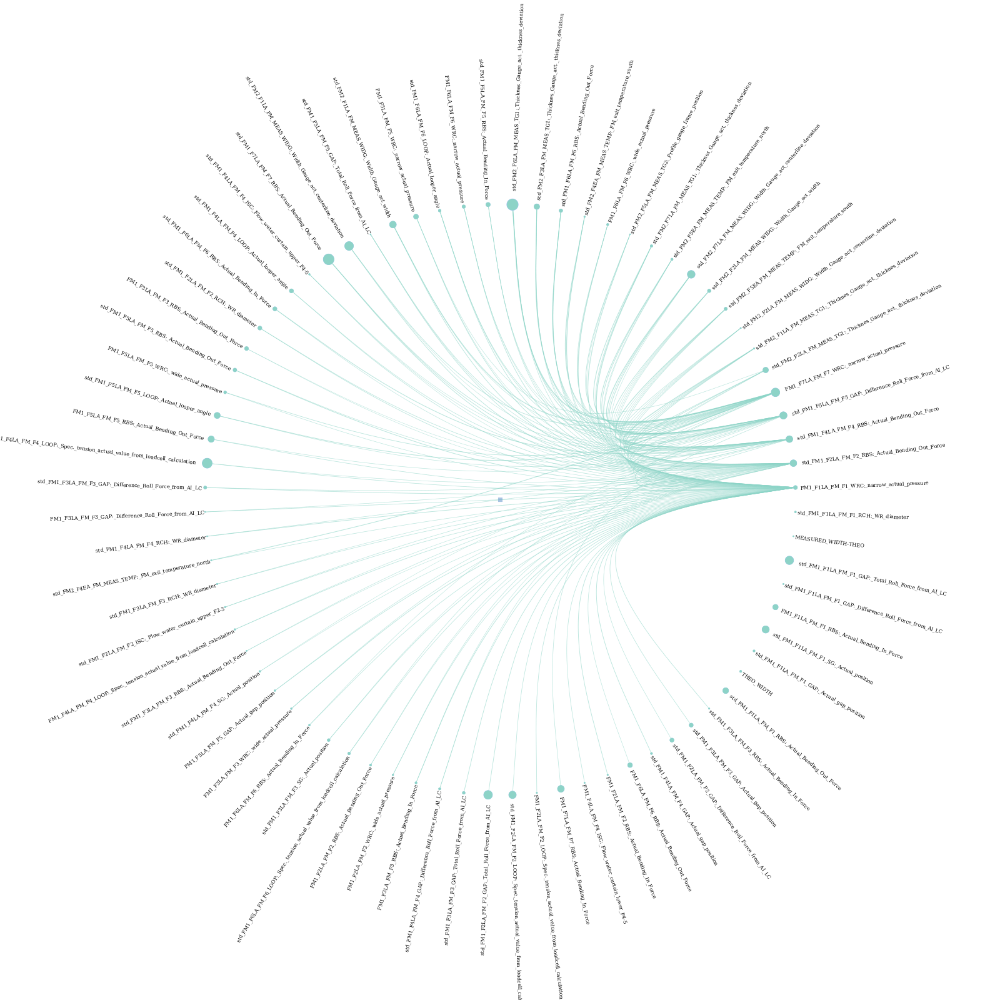

Created a graph with 31 vertices and 36 edges.
Vertices are the top 150 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 6:


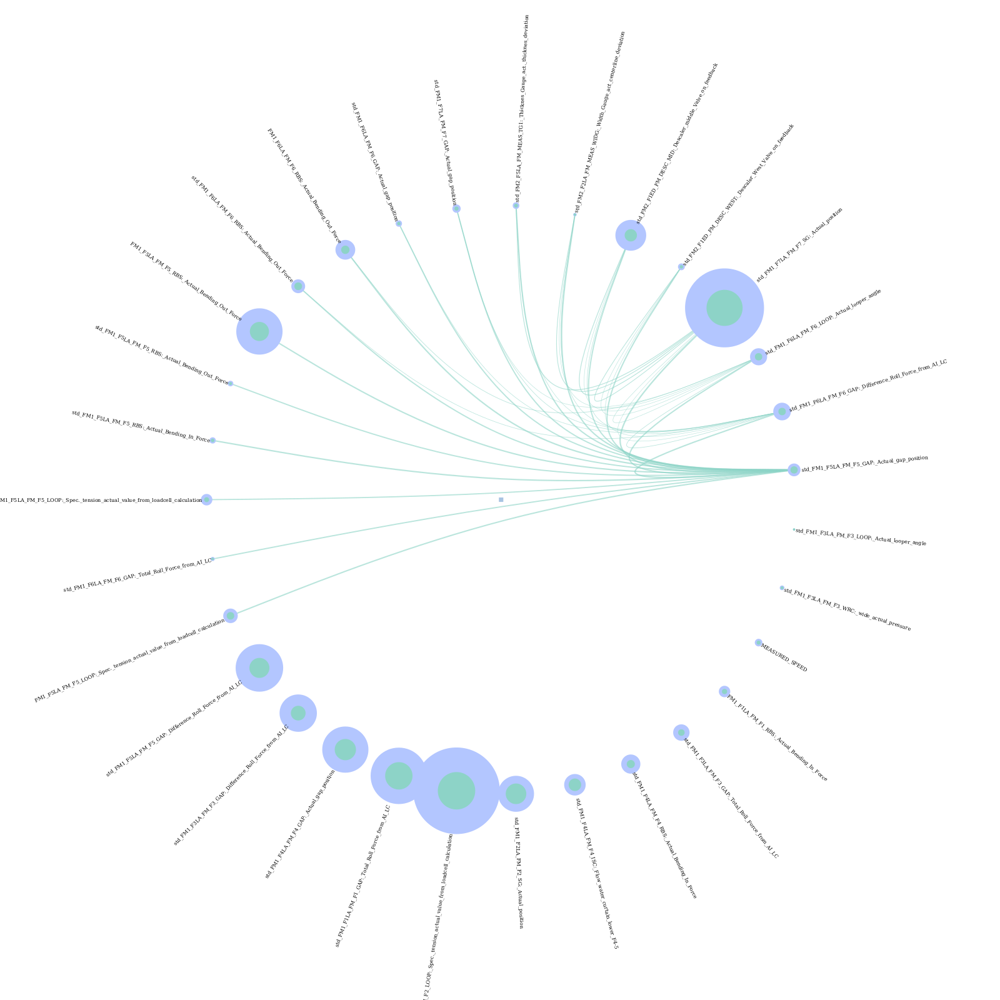

In [11]:
#import graph_tool.inference as community
from graph_tool import Graph, draw, inference

for hgroup in hgroup_selection:
    sa_dict_net = copy.deepcopy(sa_dict)
    g = nt.build_graph(sa_dict_net['hgroup'+str(hgroup)], sens='ST', top=150, min_sens=0.01,
                       edge_cutoff=0.005)
    #nt.plot_network_circle(g, inline=True, scale=200)

    inline=True
    scale=200
    
    print("Network for Hgroup "+str(hgroup)+":")

    for i in range(g.num_vertices()):
        g.vp['sensitivity'][i] = (scale * g.vp['sensitivity'][i] )

    epsens = g.edge_properties['second_sens']
    for i in g.edges():
        g.ep['second_sens'][i] =  (g.ep['second_sens'][i]) ** 2

    filename = "sensivity_network_hgroup"+str(hgroup)+"_top150_005.pdf"
    state = graph_tool.inference.minimize_nested_blockmodel_dl(g, deg_corr=True)
    draw.draw_hierarchy(state,
                        vertex_text=g.vp['param'],
                        vertex_text_position="centered",
                        layout = "radial",
                        # vertex_text_color='black',
                        vertex_font_size=8,
                        vertex_size=g.vp['sensitivity'],
                        #vertex_color='#006600',
                        #vertex_fill_color='#008800',
                        vertex_halo=True,
                        vertex_halo_color='#b3c6ff',
                        vertex_halo_size=g.vp['confidence'],
                        edge_pen_width=g.ep['second_sens'],
                        # subsample_edges=100,
                        output_size=(1600, 1600),
                        inline=inline,
                        output=filename
                        )

Created a graph with 20 vertices and 10 edges.
Vertices are the top 20 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 2:


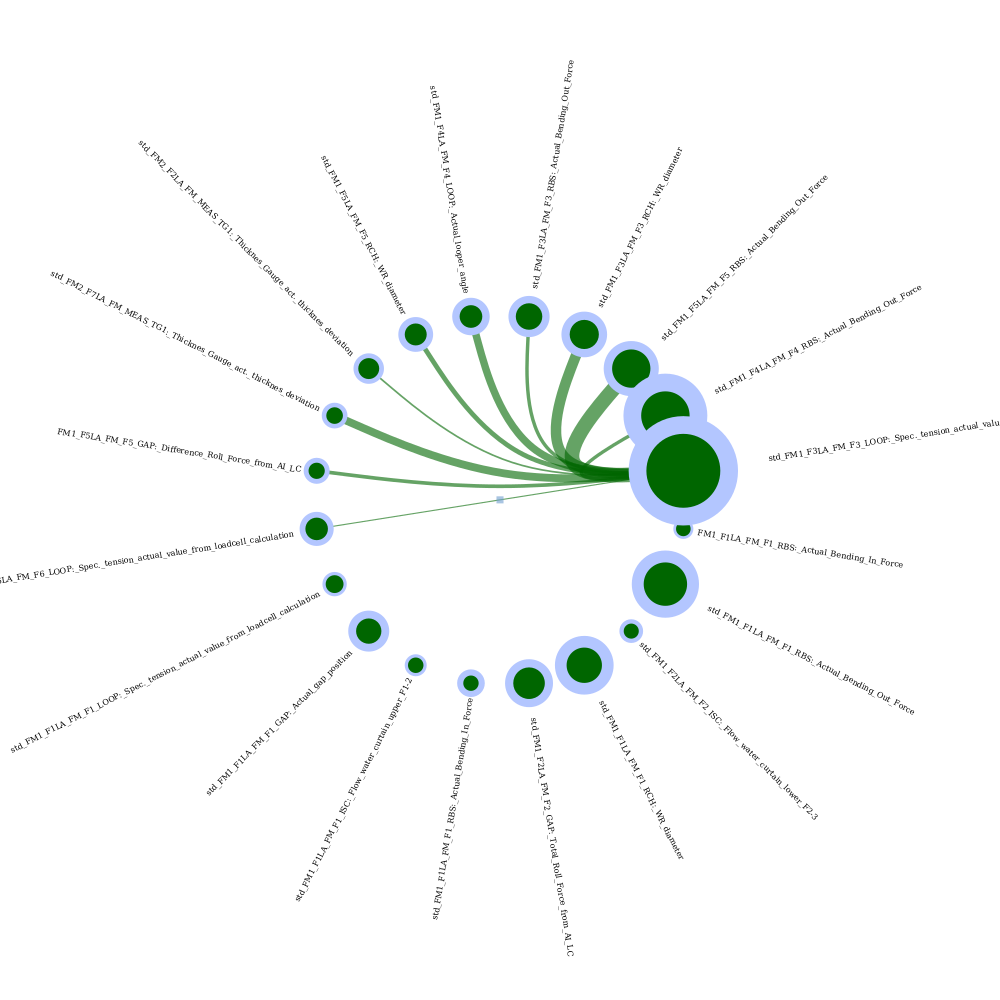

Created a graph with 20 vertices and 8 edges.
Vertices are the top 20 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 3:


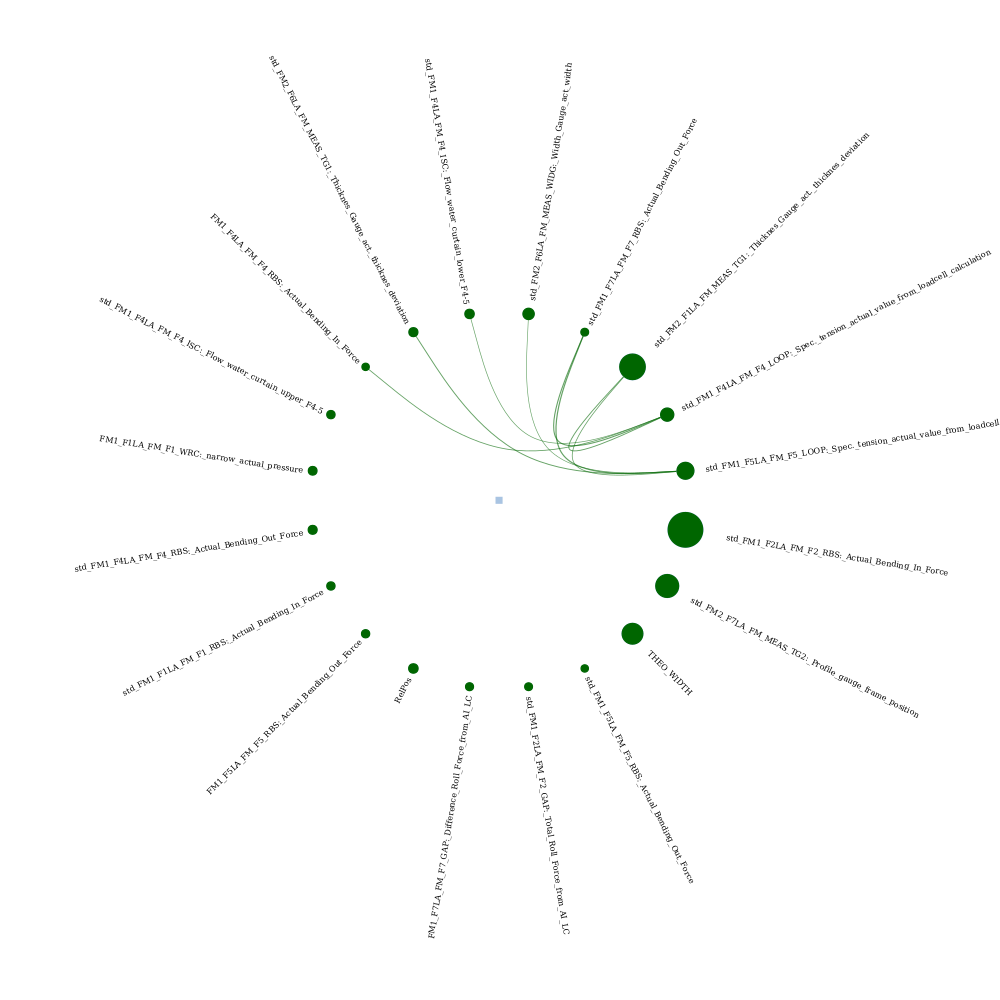

Created a graph with 20 vertices and 29 edges.
Vertices are the top 20 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 4:


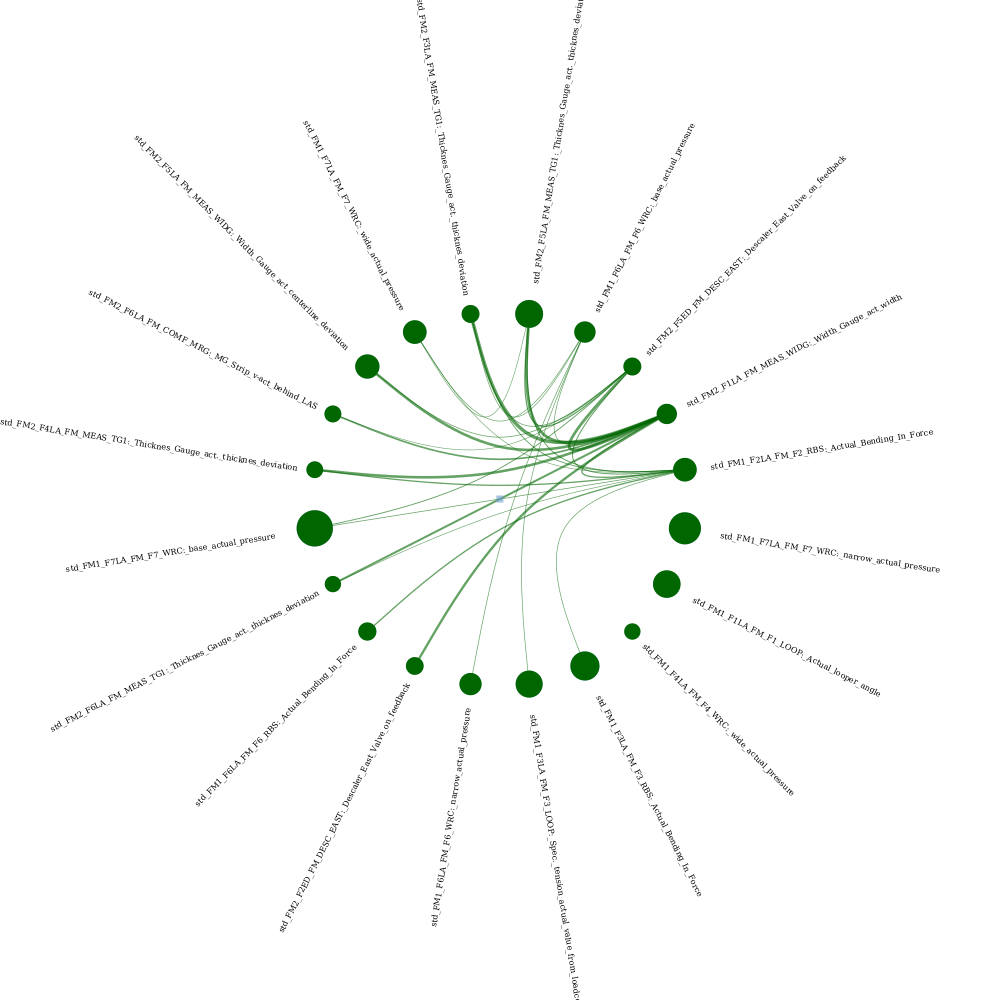

Created a graph with 20 vertices and 26 edges.
Vertices are the top 20 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 5:


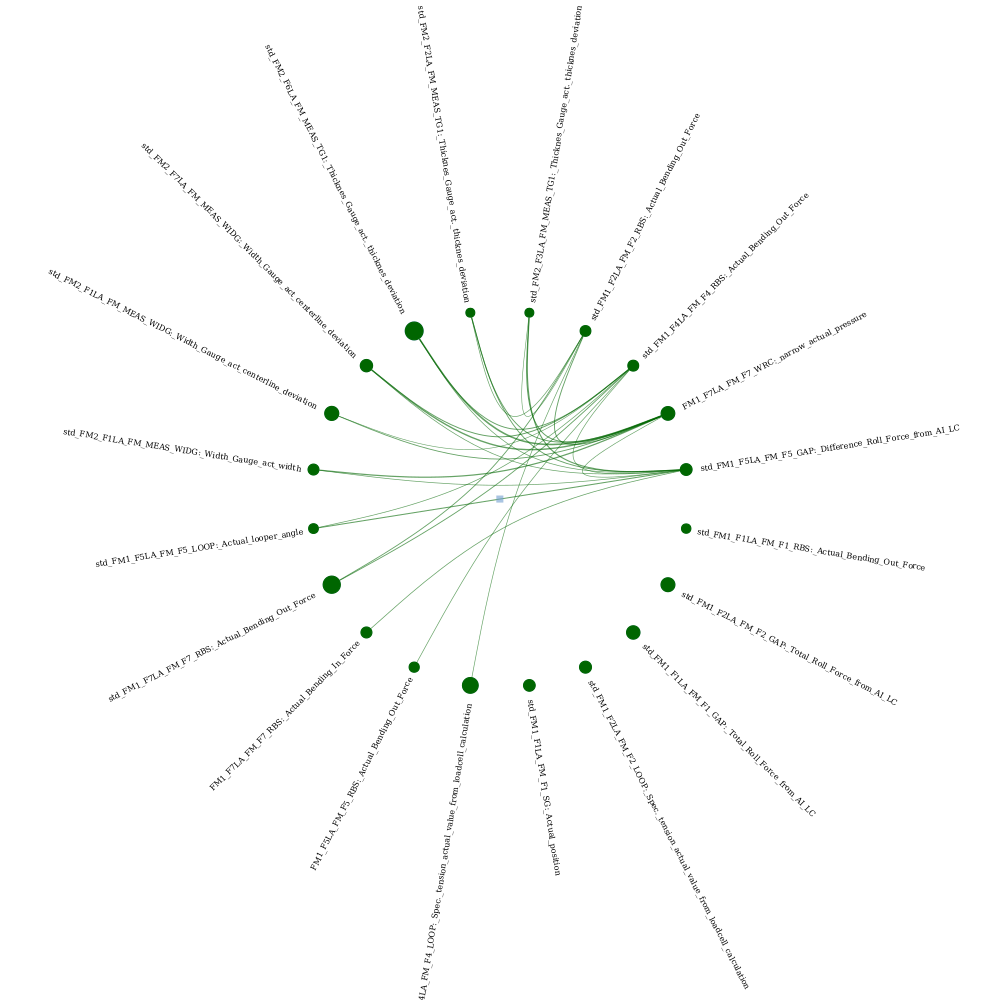

Created a graph with 20 vertices and 17 edges.
Vertices are the top 20 ST values greater than 0.01.
Only S2 values (edges) greater than 0.005 are included.
Network for Hgroup 6:


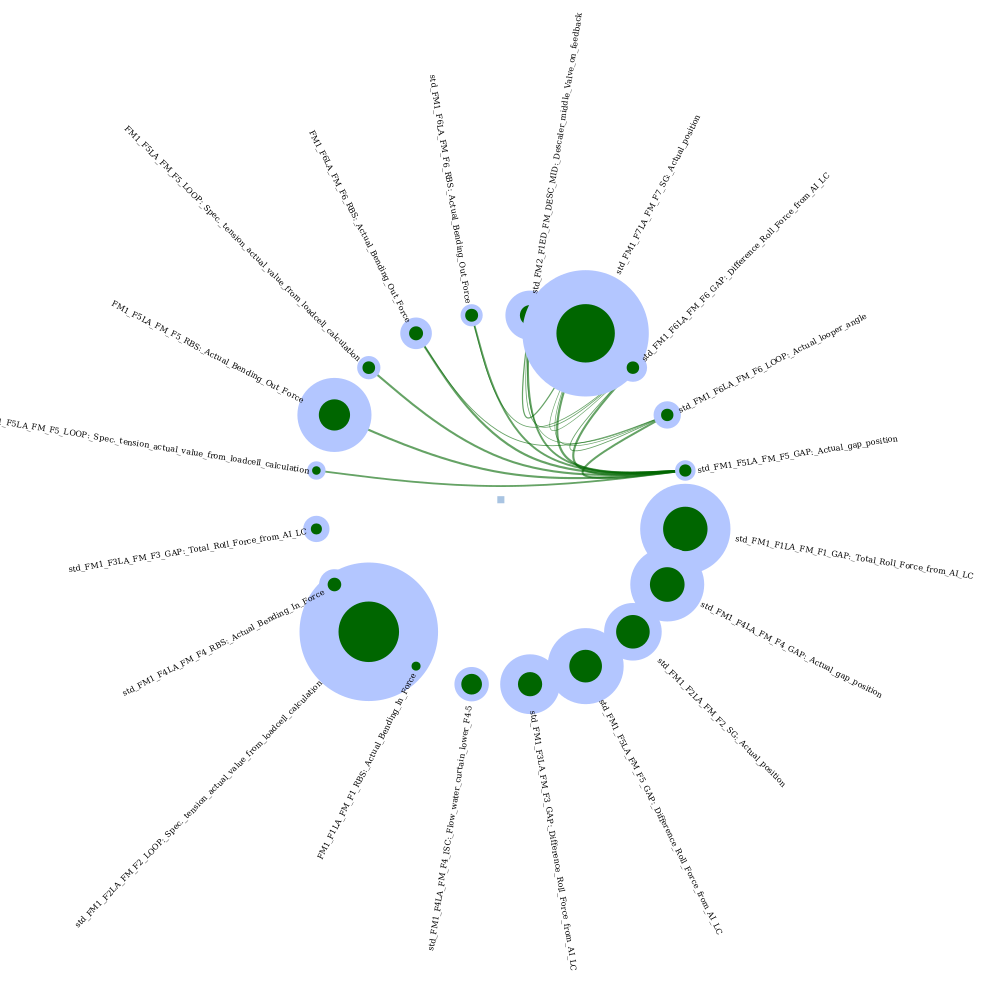

In [18]:
#Plot the top 20 nodes.
from graph_tool import Graph, draw, inference

top20_per_hgroup = {}

for hgroup in hgroup_selection:
    sa_dict_net = copy.deepcopy(sa_dict)
    g = nt.build_graph(sa_dict_net['hgroup'+str(hgroup)], sens='ST', top=20, min_sens=0.01,
                       edge_cutoff=0.005)
    #nt.plot_network_circle(g, inline=True, scale=200)

    inline=True
    scale=200
    
    print("Network for Hgroup "+str(hgroup)+":")

    top20_per_hgroup[str(hgroup)] = []
    for i in range(g.num_vertices()):
        top20_per_hgroup[str(hgroup)].append(g.vp['param'][i])
        g.vp['sensitivity'][i] = (scale * g.vp['sensitivity'][i] )

    epsens = g.edge_properties['second_sens']
    for i in g.edges():
        g.ep['second_sens'][i] =  (g.ep['second_sens'][i]) ** 2

    filename = "sensivity_network_hgroup"+str(hgroup)+"_top20_005.pdf"
    state = graph_tool.inference.minimize_nested_blockmodel_dl(g, deg_corr=True)
    draw.draw_hierarchy(state,
                        vertex_text=g.vp['param'],
                        vertex_text_position="centered",
                        layout = "radial",
                        # vertex_text_color='black',
                        vertex_font_size=8,
                        vertex_size=g.vp['sensitivity'],
                        vertex_color='#006600',
                        vertex_fill_color='#006600',
                        vertex_halo=True,
                        vertex_halo_color='#b3c6ff',
                        vertex_halo_size=g.vp['confidence'],
                        edge_pen_width=g.ep['second_sens'],
                        # subsample_edges=100,
                        output_size=(1000, 1000),
                        inline=inline,
                        output=filename
                        )

# Interpreting the Sensitivity Results

Now we check which groups of features happen to be most "important" in terms of first and second order sensitivities per hGroup.


In [19]:
#Plot the top 20 nodes.
import copy
overlap = copy.deepcopy(top20_per_hgroup["2"]) #initialize
overlap3_4 = copy.deepcopy(top20_per_hgroup["3"])
overlap3_5 = copy.deepcopy(top20_per_hgroup["3"])
overlap4_5 = copy.deepcopy(top20_per_hgroup["4"])
for hgroup in hgroup_selection:
    print("")
    print("Top 20 features for Hgroup "+str(hgroup)+":")
    
    teller = 1
    for i in top20_per_hgroup[str(hgroup)]:
        print(str(teller) + "\t "+ i)  
        teller += 1
    #calculate overlap
    for j in overlap:
        if j not in top20_per_hgroup[str(hgroup)]:
            overlap.remove(j)
    #calcullate overlap for 3, 4 and 5
    if hgroup == 4:
        for j in overlap3_4:
            if j not in top20_per_hgroup[str(hgroup)]:
                overlap3_4.remove(j)
    if hgroup == 5:
        for j in overlap4_5:
            if j not in top20_per_hgroup[str(hgroup)]:
                overlap4_5.remove(j)
        for j in overlap3_5:
            if j not in top20_per_hgroup[str(hgroup)]:
                overlap3_5.remove(j)


Top 20 features for Hgroup 2:
1	 std_FM1_F3LA_FM_F3_LOOP:_Spec._tension_actual_value_from_loadcell_calculation
2	 std_FM1_F4LA_FM_F4_RBS:_Actual_Bending_Out_Force
3	 std_FM1_F1LA_FM_F1_RBS:_Actual_Bending_Out_Force
4	 std_FM1_F5LA_FM_F5_RBS:_Actual_Bending_Out_Force
5	 std_FM1_F1LA_FM_F1_RCH:_WR_diameter
6	 std_FM1_F2LA_FM_F2_GAP:_Total_Roll_Force_from_AI_LC
7	 std_FM1_F3LA_FM_F3_RCH:_WR_diameter
8	 std_FM1_F3LA_FM_F3_RBS:_Actual_Bending_Out_Force
9	 std_FM1_F1LA_FM_F1_GAP:_Actual_gap_position
10	 std_FM1_F4LA_FM_F4_LOOP:_Actual_looper_angle
11	 std_FM1_F6LA_FM_F6_LOOP:_Spec._tension_actual_value_from_loadcell_calculation
12	 std_FM1_F5LA_FM_F5_RCH:_WR_diameter
13	 std_FM2_F2LA_FM_MEAS_TG1:_Thicknes_Gauge_act._thicknes_deviation
14	 std_FM1_F1LA_FM_F1_LOOP:_Spec._tension_actual_value_from_loadcell_calculation
15	 std_FM2_F7LA_FM_MEAS_TG1:_Thicknes_Gauge_act._thicknes_deviation
16	 FM1_F5LA_FM_F5_GAP:_Difference_Roll_Force_from_AI_LC
17	 std_FM1_F1LA_FM_F1_ISC:_Flow_water_curtain_upper

## Show the features that appear in the top 20 that appear in every hgroup

In [20]:
#overlapping features for all hgroups
print("Overlapping features in each hgroup")
teller = 1
for j in overlap:
    print( str(teller)+ "\t" + j)
    teller += 1

Overlapping features in each hgroup
1	FM1_F5LA_FM_F5_GAP:_Difference_Roll_Force_from_AI_LC


## Show the features that appear in the top 20 for groups 3,4 3,5 4,5

In [21]:
#overlapping features for hgroup 4 and 5
print("Overlapping features in hgroup 3 and 4")
teller = 1
for j in overlap3_4:
    print( str(teller)+ "\t" + j)
    teller += 1

print("")
print("Overlapping features in hgroup 3 and 5")
teller = 1
for j in overlap3_5:
    print( str(teller)+ "\t" + j)
    teller += 1

print("")
print("Overlapping features in hgroup 4 and 5")
teller = 1
for j in overlap4_5:
    print( str(teller)+ "\t" + j)
    teller += 1

Overlapping features in hgroup 3 and 4
1	std_FM1_F2LA_FM_F2_RBS:_Actual_Bending_In_Force
2	std_FM2_F7LA_FM_MEAS_TG2:_Profile_gauge_frame_position
3	std_FM1_F5LA_FM_F5_LOOP:_Spec._tension_actual_value_from_loadcell_calculation
4	std_FM2_F6LA_FM_MEAS_WIDG:_Width_Gauge_act_width
5	std_FM1_F4LA_FM_F4_ISC:_Flow_water_curtain_lower_F4-5
6	std_FM2_F6LA_FM_MEAS_TG1:_Thicknes_Gauge_act._thicknes_deviation
7	FM1_F1LA_FM_F1_WRC:_narrow_actual_pressure
8	std_FM1_F1LA_FM_F1_RBS:_Actual_Bending_In_Force
9	FM1_F7LA_FM_F7_GAP:_Difference_Roll_Force_from_AI_LC
10	std_FM1_F7LA_FM_F7_RBS:_Actual_Bending_Out_Force
11	FM1_F4LA_FM_F4_RBS:_Actual_Bending_In_Force

Overlapping features in hgroup 3 and 5
1	std_FM2_F1LA_FM_MEAS_TG1:_Thicknes_Gauge_act._thicknes_deviation
2	THEO_WIDTH
3	std_FM1_F4LA_FM_F4_LOOP:_Spec._tension_actual_value_from_loadcell_calculation
4	RelPos
5	std_FM2_F6LA_FM_MEAS_TG1:_Thicknes_Gauge_act._thicknes_deviation
6	std_FM1_F4LA_FM_F4_RBS:_Actual_Bending_Out_Force
7	std_FM1_F4LA_FM_F4_ISC



# Morris Sensitivity Analysis

In applied statistics, the Morris method for global sensitivity analysis is a so-called one-step-at-a-time method (OAT), meaning that in each run only one input parameter is given a new value. It facilitates a global sensitivity analysis by making a number r of local changes at different points x(1 → r) of the possible range of input values.



Hgroup 2


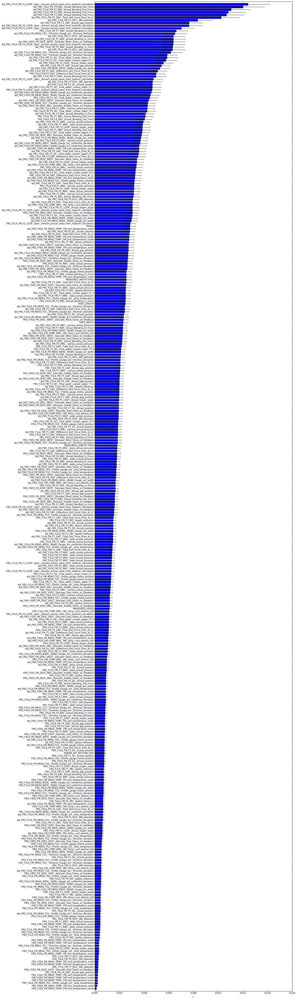

Hgroup 3


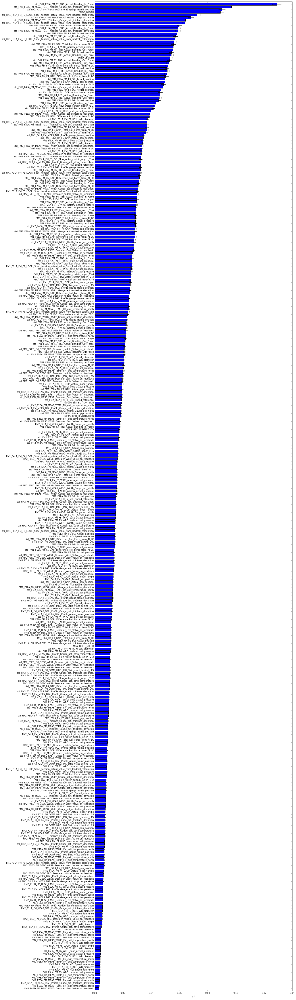

Hgroup 4


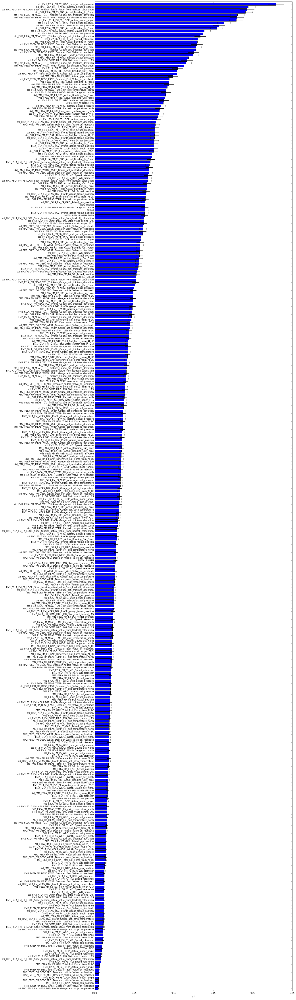

Hgroup 5


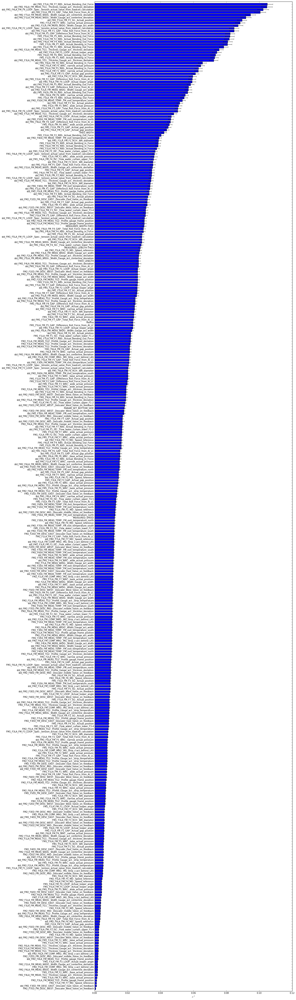

IOError: [Errno 2] No such file or directory: 'resuls/morris_analysis_6.npy'

In [24]:
%matplotlib inline
from SALib.plotting.morris import horizontal_bar_plot, covariance_plot, \
                                sample_histograms
from SALib.sample.morris import sample
import matplotlib.pyplot as plt

for hgroup in hgroup_selection:
    Si = np.load('resuls/morris_analysis_'+str(hgroup)+'.npy').item() 
    print("Hgroup "+str(hgroup))
    fig, (ax1) = plt.subplots(1, 1, figsize=[16,80])
    horizontal_bar_plot(ax1, Si,{}, sortby='mu_star')
    plt.show()

    #fig2, (ax2) = plt.subplots(1, 1, figsize=[12,12])
    #covariance_plot(ax2, Si, {})
    #plt.show()

    #fig3 = plt.figure()
    #sample_histograms(fig2, param_values, problem, {'color':'y'})
    